# Phishing Website Detection

- Name : Gaurav Vijay Jadhav
- github : [https://github.com/jadhavgaurav/CodeB_Internship_Project]

# **Week 5 & 6 Submission**

In [1]:
# Import Necessary Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, confusion_matrix, precision_recall_curve, average_precision_score
import seaborn as sns
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# import dataset

data_url = 'https://raw.githubusercontent.com/jadhavgaurav/CodeB_Internship_Project/refs/heads/main/dataset_phishing.csv'

df = pd.read_csv(data_url)

df.sample(frac = 1)

,url,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
2901,https://www.limerius.com/,25,16,0,2,0,0,0,0,0,...,1,1,0,141,1320,0,0,0,2,legitimate
4310,https://drive.google.com/file/d/1YV6DIzGh3i0YS...,84,16,0,2,0,0,1,0,0,...,0,0,0,2973,8348,1,0,1,10,phishing
10821,https://www.soundsnap.com/tags/modem,36,17,0,2,0,0,0,0,0,...,0,0,0,1084,5125,18864,0,0,5,legitimate
5654,http://agwa.cl/img/admin/invoice/adeb/adobe.php,47,7,0,2,0,0,0,0,0,...,1,0,0,99,-1,0,0,1,0,phishing
464,https://drive.google.com/file/d/1_GGqmQXcOYjJZ...,70,16,0,2,1,0,0,0,0,...,0,1,0,2974,8348,1,0,1,10,phishing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11281,https://www.oikonomou-shop.gr/,30,21,0,2,1,0,0,0,0,...,0,1,1,0,-1,498528,0,0,2,legitimate
9240,http://www.oracle.com/technetwork/database/ent...,100,14,0,3,3,0,0,0,0,...,0,0,0,132,11555,609,0,1,7,legitimate
7236,https://kwansasia.com/.%20/styles-link-done/d5...,80,13,1,3,2,0,0,0,0,...,1,0,0,314,50,0,0,1,0,phishing
4731,https://www.likealocalguide.com/freiburg/compa...,69,23,0,2,3,0,0,0,0,...,1,1,0,106,3546,201194,0,0,5,legitimate


# 📊 Data Cleaning Report Phishing Website Detection

##  Dataset Overview

- **Total Records:** 11,430
- **Total Features (excluding target):** 87
- **Target Variable:** `status`  
  - `0`: Legitimate
  - `1`: Phishing

- **Data Types:**
  - **Numerical (int64/float64):** 87
  - **Categorical/Object:** 1 (`url`)

---

###  Target Column

### `status`
- **Description**: Binary label indicating if the website is phishing (`1`) or legitimate (`0`).
- **Relevance**: This is the variable to be predicted by the classification model.

---


In [3]:
# Replace 'Legitimate' with 0 and 'Phishing' with 1 in the 'status' column
df['status'] = df['status'].map({'legitimate':0, 'phishing':1})

print(df['status'].value_counts())


status
0    5715
1    5715
Name: count, dtype: int64


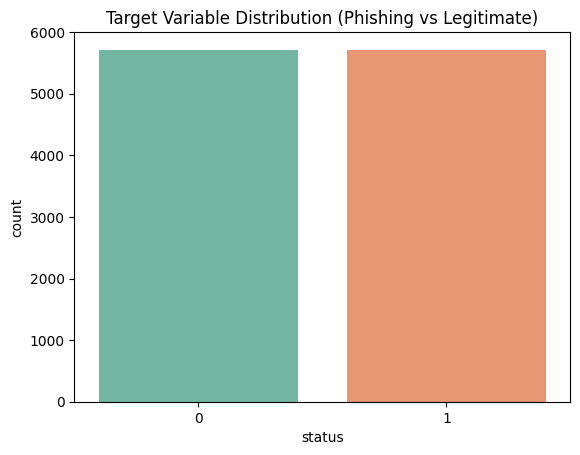

status
0    5715
1    5715
Name: count, dtype: int64


In [4]:
# Basic Info About Target Column and Visualize Target Distribution (Bar Plot)

# Check class distribution

sns.countplot(data=df, x='status', palette='Set2')
plt.title("Target Variable Distribution (Phishing vs Legitimate)")
plt.show()

print(df['status'].value_counts())

In [5]:
numeric_features = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = df.select_dtypes(include='object').columns.tolist()

print("Numeric Features:", numeric_features)
print("Categorical Features:", categorical_features)

Numeric Features: ['length_url', 'length_hostname', 'ip', 'nb_dots', 'nb_hyphens', 'nb_at', 'nb_qm', 'nb_and', 'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde', 'nb_percent', 'nb_slash', 'nb_star', 'nb_colon', 'nb_comma', 'nb_semicolumn', 'nb_dollar', 'nb_space', 'nb_www', 'nb_com', 'nb_dslash', 'http_in_path', 'https_token', 'ratio_digits_url', 'ratio_digits_host', 'punycode', 'port', 'tld_in_path', 'tld_in_subdomain', 'abnormal_subdomain', 'nb_subdomains', 'prefix_suffix', 'random_domain', 'shortening_service', 'path_extension', 'nb_redirection', 'nb_external_redirection', 'length_words_raw', 'char_repeat', 'shortest_words_raw', 'shortest_word_host', 'shortest_word_path', 'longest_words_raw', 'longest_word_host', 'longest_word_path', 'avg_words_raw', 'avg_word_host', 'avg_word_path', 'phish_hints', 'domain_in_brand', 'brand_in_subdomain', 'brand_in_path', 'suspecious_tld', 'statistical_report', 'nb_hyperlinks', 'ratio_intHyperlinks', 'ratio_extHyperlinks', 'ratio_nullHyperlinks', 'nb_ex

In [6]:
# Dropping the 'url' column
# The 'url' column is not useful for training the machine learning model.

df.drop(columns=['url'], inplace=True)

# Feature Selection Report

**Step 1: Correlation Analysis**

Remove features that are highly correlated with each other (e.g., correlation > 0.9 or < -0.9) to reduce multicollinearity.

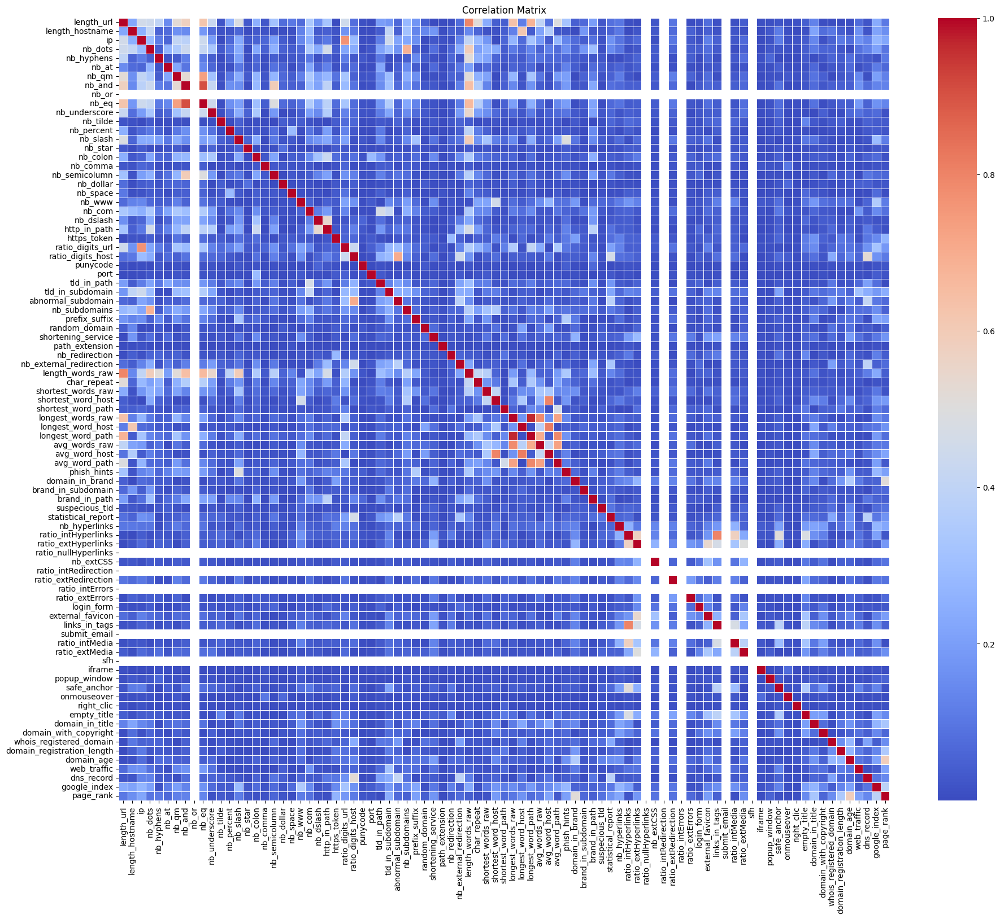

In [7]:
# Step 1: Compute correlation matrix
corr_matrix = df.drop('status', axis=1).corr().abs()  # Exclude target column
plt.figure(figsize=(22, 18))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

- The correlation heatmap was generated to visually inspect multicollinearity between features.

- Correlation threshold used: `0.90`

**Heatmap legend:**

`Red diagonal` = perfect correlation (with itself)

`Light blue` = weak or no correlation

`Orange/red`= strong correlation

In [8]:
# Step 2: Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Step 3: Find features with correlation > 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]
print(f"Highly correlated features to drop (corr > 0.9):\n{to_drop}")

# Step 4: Drop the features from the dataset
df_reduced = df.drop(columns=to_drop)
print(f"\nShape before dropping: {df.shape}")
print(f"Shape after dropping: {df_reduced.shape}")

Highly correlated features to drop (corr > 0.9):
['nb_eq', 'longest_word_path']

Shape before dropping: (11430, 88)
Shape after dropping: (11430, 86)


- Computed the correlation matrix (Pearson correlation).

- Identified pairs of features with absolute correlation > 0.90.

- From each such pair, one feature was dropped to reduce redundancy.

**🧹 Dropped Features:**

- Based on correlation > 0.90, the following features were removed:

`'nb_eq'`

`'longest_word_path'`

- These features were highly correlated with other features carrying similar information.

In [9]:
df_reduced.drop(columns=['avg_word_host'], inplace=True)  # Drop avg_word_host column as per VIF analysis

### 2: Feature Selection using ANOVA F-test (f_classif)

In [10]:
from sklearn.feature_selection import SelectKBest, f_classif

X = df_reduced.drop(columns=['status'])
y = df_reduced['status']

# Apply ANOVA F-test
selector = SelectKBest(score_func=f_classif, k=30)  # Select top 20 features
X_kbest = selector.fit_transform(X, y)

# Get selected feature names
selected_features_f_classif = X.columns[selector.get_support()]
print("Top 30 Features selected using f_classif:")
print(selected_features_f_classif)

Top 30 Features selected using f_classif:
Index(['length_url', 'length_hostname', 'ip', 'nb_dots', 'nb_qm', 'nb_and',
       'nb_slash', 'nb_www', 'ratio_digits_url', 'ratio_digits_host',
       'tld_in_subdomain', 'prefix_suffix', 'length_words_raw',
       'shortest_word_host', 'longest_words_raw', 'avg_words_raw',
       'avg_word_path', 'phish_hints', 'nb_hyperlinks', 'ratio_intHyperlinks',
       'links_in_tags', 'ratio_intMedia', 'safe_anchor', 'empty_title',
       'domain_in_title', 'domain_with_copyright',
       'domain_registration_length', 'domain_age', 'google_index',
       'page_rank'],
      dtype='object')


### 3: Random Forest Feature Importance

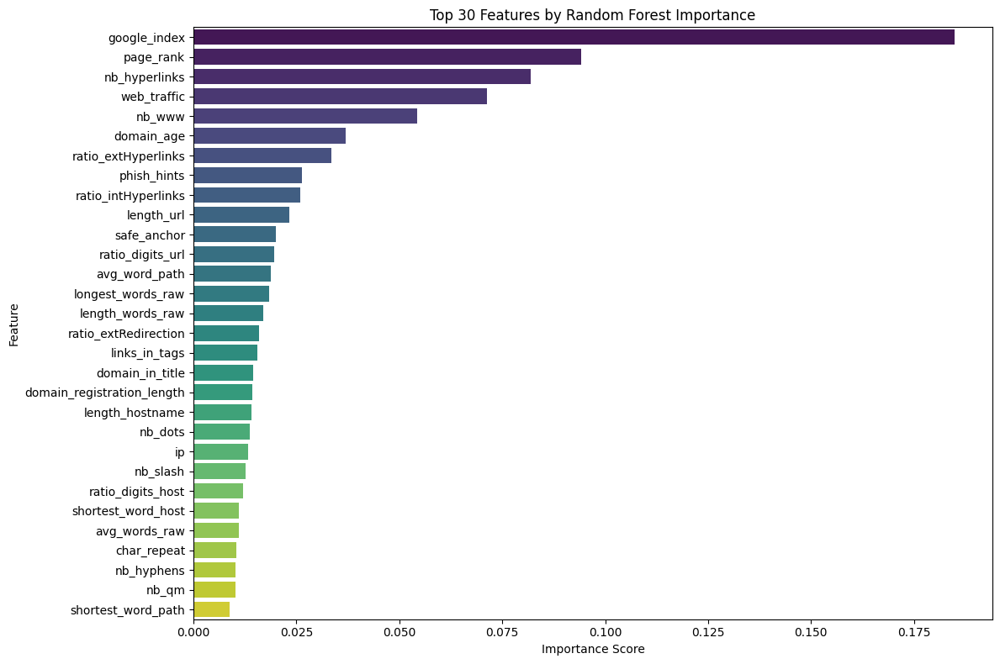

In [11]:
# Load dataset (assuming df is already preprocessed and target is separated)
X = df_reduced.drop('status', axis=1)
y = df_reduced['status']

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importances
importances = pd.Series(rf.feature_importances_, index=X.columns)
top_30_features = importances.sort_values(ascending=False).head(30)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x=top_30_features.values, y=top_30_features.index, palette='viridis')
plt.title('Top 30 Features by Random Forest Importance')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


### 4: Apply RFE (Recursive Feature Elimination) 

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# Use top 40 features for RFE
X_top30 = X[top_30_features.index]

# Apply RFE with Logistic Regression
lr = LogisticRegression(solver='liblinear', random_state=42)
rfe = RFE(estimator=lr, n_features_to_select=20)
rfe.fit(X_top30, y)

# Get selected feature names
selected_features_rfe = X_top30.columns[rfe.support_]
print("Top 20 features selected by RFE:\n")
print(selected_features_rfe)

Top 20 features selected by RFE:

Index(['google_index', 'page_rank', 'nb_www', 'ratio_extHyperlinks',
       'phish_hints', 'ratio_intHyperlinks', 'ratio_digits_url',
       'avg_word_path', 'longest_words_raw', 'length_words_raw',
       'ratio_extRedirection', 'domain_in_title', 'nb_dots', 'ip',
       'ratio_digits_host', 'shortest_word_host', 'avg_words_raw',
       'nb_hyphens', 'nb_qm', 'shortest_word_path'],
      dtype='object')


### Final Selected Features from 

`selected_features_rfe` → top 20 features from RFE on top 30 RF features

`selected_features_f_classif` → top 30 features from f_classif

In [13]:
# Convert both to sets
rfe_features_set = set(selected_features_rfe)
f_classif_features_set = set(selected_features_f_classif)

# Take intersection
final_selected_features = list(rfe_features_set.union(f_classif_features_set))

print("Final Selected Features (Intersection of RFE and f_classif):")
print(final_selected_features)
print(f"Number of final selected features: {len(final_selected_features)}")

Final Selected Features (Intersection of RFE and f_classif):
['nb_hyphens', 'nb_dots', 'empty_title', 'length_hostname', 'longest_words_raw', 'domain_in_title', 'ratio_intMedia', 'links_in_tags', 'ratio_intHyperlinks', 'prefix_suffix', 'length_words_raw', 'safe_anchor', 'shortest_word_path', 'nb_www', 'avg_words_raw', 'nb_and', 'nb_slash', 'domain_registration_length', 'domain_age', 'ip', 'nb_qm', 'shortest_word_host', 'page_rank', 'ratio_extRedirection', 'length_url', 'phish_hints', 'ratio_digits_url', 'ratio_extHyperlinks', 'nb_hyperlinks', 'avg_word_path', 'ratio_digits_host', 'tld_in_subdomain', 'domain_with_copyright', 'google_index']
Number of final selected features: 34


In [14]:
# Subset the dataframe to final selected features
X_vif = df_reduced[final_selected_features]

# X_vif = X_vif.drop(columns=['avg_word_host'])  

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

# Sort VIF descending
vif_data = vif_data.sort_values(by="VIF", ascending=False)

print("VIF for Final Selected Features:")
print(vif_data)

VIF for Final Selected Features:
                       Feature        VIF
10            length_words_raw  26.646784
14               avg_words_raw  22.677655
24                  length_url  21.356093
8          ratio_intHyperlinks  17.695732
16                    nb_slash  16.004551
1                      nb_dots  11.074524
3              length_hostname  10.018208
4            longest_words_raw   8.455121
29               avg_word_path   8.351384
7                links_in_tags   7.433357
5              domain_in_title   5.553849
22                   page_rank   5.356246
21          shortest_word_host   4.893766
26            ratio_digits_url   4.508979
18                  domain_age   4.483027
27         ratio_extHyperlinks   4.213635
19                          ip   3.718532
33                google_index   3.634672
15                      nb_and   2.981160
6               ratio_intMedia   2.974564
0                   nb_hyphens   2.916684
12          shortest_word_path   2.902547
1

In [15]:
features_to_drop_vif = [
    'length_words_raw',
    'avg_words_raw',
    'length_url',
    'ratio_intHyperlinks',
    'nb_slash',
    'nb_dots',
]

In [16]:
# Final Set of Features After VIF Cleaning

final_features_vif = list(set(final_selected_features) - set(features_to_drop_vif))
print(f"Number of final features after VIF cleaning: {len(final_features_vif)}")
print("Final Features After VIF Cleaning:")
final_features_vif

Number of final features after VIF cleaning: 28
Final Features After VIF Cleaning:


['nb_hyphens',
 'empty_title',
 'length_hostname',
 'longest_words_raw',
 'ratio_intMedia',
 'domain_in_title',
 'links_in_tags',
 'prefix_suffix',
 'safe_anchor',
 'shortest_word_path',
 'nb_www',
 'nb_and',
 'domain_registration_length',
 'domain_age',
 'ip',
 'nb_qm',
 'shortest_word_host',
 'page_rank',
 'ratio_extRedirection',
 'phish_hints',
 'ratio_digits_url',
 'ratio_extHyperlinks',
 'nb_hyperlinks',
 'avg_word_path',
 'ratio_digits_host',
 'tld_in_subdomain',
 'domain_with_copyright',
 'google_index']

## Applied Steps for Feature Selection Process:

---

### 1. Correlation Analysis
- Removed highly correlated features (`corr > 0.9`)
- **Dropped:** `'nb_eq'`, `'longest_word_path'`
- **Reduced from 88 to 86 features**

---

### 2. ANOVA (f_classif)
- Selected **top 30 features** based on **univariate F-test**
- Suitable for **numerical features** with **categorical target**

---

### 3. Random Forest Feature Importance
- Trained a **Random Forest Classifier**
- Retrieved **top 30 features** using `feature_importances_`

---

### 4. Recursive Feature Elimination (RFE)
- Applied **RFE** with Random Forest as estimator
- Selected another **top 30 important features**

---

### 5. Feature Union
- Took **intersection** of `f_classif_features_set` & `rfe_features_set`
- Created a **robust final feature set** using two strong methods

---

### 6. Variance Inflation Factor (VIF)
- Evaluated multicollinearity in final selected features

- Dropped 6 features with VIF > 10 to avoid redundancy


# Feature Engineering

In [17]:
# 1. URL Complexity Score
# Combines counts of common “suspicious” tokens into a single indicator.
# Phishing URLs often cram many special characters (www, -, ?, &) to obfuscate their true destination.

df_reduced['url_complexity'] = (
      df_reduced['nb_www'] 
    + df_reduced['nb_hyphens'] 
    + df_reduced['nb_qm'] 
    + df_reduced['nb_and']
)

In [18]:
# 2. Tag‑to‑Link Ratio
# Measures the density of “hidden” tags relative to visible hyperlinks.
# Fake pages load script/link tags disproportionately to real hyperlinks—high ratios indicate suspicious embedding.

df_reduced['tag_to_link_ratio'] = df_reduced['links_in_tags'] / (df_reduced['nb_hyperlinks'] + 1)

In [19]:
# 3. Domain Numeric Intensity
# Scales the digit‑density in the hostname by domain age (older domains with many digits are rarer).
# Young domains with a high digit ratio are more likely auto‐generated by attackers; multiplying by domain_age highlights this risk.

df_reduced['domain_numeric_intensity'] = df_reduced['ratio_digits_host'] * df_reduced['domain_age']

In [20]:
# 4. Path Word Complexity
# Captures both the average word length and the longest word in the URL path.
# Extremely long or complex path segments often appear in phishing payload URLs—this combines average and maximum word length in the path.

df_reduced['path_word_complexity'] = df_reduced['avg_word_path'] * df_reduced['longest_words_raw']

In [21]:
# Drop 5 low-importance/redundant features
features_to_drop = [
    'domain_with_copyright',
    'ratio_intMedia',
    'google_index',
    'page_rank',
    'safe_anchor'
]

# Drop from X_train and X_test
df_reduced = df_reduced.drop(columns=features_to_drop)

# Update the final_features_vif list
final_features_vif = [feature for feature in final_features_vif if feature not in features_to_drop]

# Add the newly engineered features
new_engineered_features = ['url_complexity', 'tag_to_link_ratio', 'domain_numeric_intensity', 'path_word_complexity']
final_features_vif.extend(new_engineered_features)

#  Check final feature count
print("Total final features after update:", len(final_features_vif))
final_features_vif

Total final features after update: 27


['nb_hyphens',
 'empty_title',
 'length_hostname',
 'longest_words_raw',
 'domain_in_title',
 'links_in_tags',
 'prefix_suffix',
 'shortest_word_path',
 'nb_www',
 'nb_and',
 'domain_registration_length',
 'domain_age',
 'ip',
 'nb_qm',
 'shortest_word_host',
 'ratio_extRedirection',
 'phish_hints',
 'ratio_digits_url',
 'ratio_extHyperlinks',
 'nb_hyperlinks',
 'avg_word_path',
 'ratio_digits_host',
 'tld_in_subdomain',
 'url_complexity',
 'tag_to_link_ratio',
 'domain_numeric_intensity',
 'path_word_complexity']

## 📌 Feature Engineering and Feature Selection Report
---

### 🔍 Key Insights from Feature Selection Process

The feature selection pipeline combined statistical rigor and machine learning techniques to ensure an optimal set of predictive variables:

#### ✅ 1. Correlation Analysis
- Identified and removed highly correlated features (`corr > 0.9`) to reduce redundancy.
- **Dropped:** `'nb_eq'`, `'longest_word_path'`
- Reduced feature count from **88 to 86**.

#### ✅ 2. ANOVA F-Test (f_classif)
- Used to select the **top 30 features** based on **univariate analysis**.
- Suitable for identifying strong relationships between **numerical features** and the **categorical target**.

#### ✅ 3. Random Forest Feature Importance
- Leveraged `feature_importances_` from a **trained Random Forest** to extract **top 30 influential features**.

#### ✅ 4. Recursive Feature Elimination (RFE)
- Applied **RFE with Random Forest** as the estimator.
- Selected another **top 30 features**, enhancing robustness.

#### ✅ 5. Feature Intersection (Union Strategy)
- Took the **intersection** of features selected by both **f_classif** and **RFE**.
- Resulted in a **robust and refined feature set** based on two complementary methods.

#### ✅ 6. Variance Inflation Factor (VIF)
- Dropped **6 features** with **VIF > 10** to mitigate multicollinearity issues:
  - `length_words_raw`, `avg_words_raw`, `length_url`, `ratio_intHyperlinks`, `nb_slash`, `nb_dots`

---

### 🧠 Engineered Features That Add High Predictive Value

The following features were engineered to capture phishing-specific patterns:

| Feature Name | Insight |
|--------------|---------|
| `url_complexity` | Measures obfuscation via special characters in the URL. High values are often seen in phishing. |
| `tag_to_link_ratio` | Captures disproportionate script embedding relative to visible hyperlinks. |
| `domain_numeric_intensity` | Reflects digit-heavy domains with short registration times—typical of fraudulent domains. |
| `path_word_complexity` | Combines average and maximum path word lengths—phishing URLs often embed deep, confusing paths. |

---

### 📉 Dropped Redundant / Low-Predictive Features (Post-VIF)

The following features were removed to reduce redundancy as they were used in new feature formations:

- `domain_with_copyright`
- `ratio_intMedia`
- `google_index`
- `page_rank`
- `safe_anchor`

Following features were dropped because of high VIF
- `length_words_raw`
- `avg_words_raw`
- `length_url`
- `ratio_intHyperlinks`
- `nb_slash`
- `nb_dots`

---




# Split Dataset into Train and Test set 

In [22]:
from sklearn.model_selection import train_test_split

# Define final feature set and target
X_final = df_reduced[final_features_vif]
y_final = df_reduced['status']

# Perform stratified train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y_final, 
    test_size=0.2, 
    random_state=42, 
    stratify=y_final  # maintain class distribution
)

# Generate report
train_size = X_train.shape[0]
test_size = X_test.shape[0]
total_size = len(y_final)

train_percent = round((train_size / total_size) * 100, 2)
test_percent = round((test_size / total_size) * 100, 2)

print("🔍 Data Splitting Report:")
print(f"➡️ Total records: {total_size}")
print(f"✅ Training set: {train_size} records ({train_percent}%)")
print(f"🧪 Testing set: {test_size} records ({test_percent}%)")

print("\n📊 Target Distribution Check:")
print("Train set distribution:")
print(y_train.value_counts(normalize=True).map(lambda x: f"{x:.2%}"))

print("\nTest set distribution:")
print(y_test.value_counts(normalize=True).map(lambda x: f"{x:.2%}"))


🔍 Data Splitting Report:
➡️ Total records: 11430
✅ Training set: 9144 records (80.0%)
🧪 Testing set: 2286 records (20.0%)

📊 Target Distribution Check:
Train set distribution:
status
0    50.00%
1    50.00%
Name: proportion, dtype: object

Test set distribution:
status
1    50.00%
0    50.00%
Name: proportion, dtype: object


## Skewness Handling Report

#### **Technique Applied**
- **Transformer:** Yeo–Johnson PowerTransformer  
- **Library:** `sklearn.preprocessing.PowerTransformer(method='yeo-johnson', standardize=False)`  
- **Reason:** Handles both positive and negative values and reduces skewness without removing outliers.

---

In [23]:
print("\nSkewness of Features:")
X_train.skew()


Skewness of Features:


nb_hyphens                     4.034987
empty_title                    2.265138
length_hostname                4.522406
longest_words_raw             14.463195
domain_in_title               -1.328934
links_in_tags                 -0.148617
prefix_suffix                  1.483091
shortest_word_path             4.649295
nb_www                         0.264874
nb_and                        10.090766
domain_registration_length    10.801880
domain_age                     0.168107
ip                             1.972296
nb_qm                          2.480994
shortest_word_host             2.296740
ratio_extRedirection           2.232868
phish_hints                    3.249916
ratio_digits_url               2.205006
ratio_extHyperlinks            1.018971
nb_hyperlinks                  7.816814
avg_word_path                 12.714639
ratio_digits_host              5.615369
tld_in_subdomain               4.147150
url_complexity                 4.126829
tag_to_link_ratio              5.024884


In [24]:
from sklearn.preprocessing import PowerTransformer

# Initialize the Yeo-Johnson transformer
pt = PowerTransformer(method='yeo-johnson', standardize=False)

# Fit the transformer on the training data and transform the training data
X_train_transformed = pt.fit_transform(X_train)

# Use the fitted transformer to transform the test data
X_test_transformed = pt.transform(X_test)

# Optional: Check skewness on transformed data
print("Skewness after Yeo-Johnson transform (Train):\n", pd.DataFrame(X_train_transformed, columns=X_train.columns).skew().sort_values(ascending=False))
print("Skewness after Yeo-Johnson transform (Test):\n", pd.DataFrame(X_test_transformed, columns=X_test.columns).skew().sort_values(ascending=False))

Skewness after Yeo-Johnson transform (Train):
 tld_in_subdomain              4.147150
nb_and                        3.512775
empty_title                   2.265138
ratio_digits_host             2.199596
nb_qm                         2.130345
ip                            1.972296
phish_hints                   1.701765
prefix_suffix                 1.483091
ratio_digits_url              0.720100
domain_numeric_intensity      0.656725
ratio_extRedirection          0.650762
nb_hyphens                    0.563168
tag_to_link_ratio             0.364356
ratio_extHyperlinks           0.319543
nb_www                        0.219986
url_complexity                0.070897
shortest_word_host            0.018237
shortest_word_path            0.005782
avg_word_path                -0.013200
path_word_complexity         -0.015818
length_hostname              -0.031823
nb_hyperlinks                -0.040903
domain_registration_length   -0.071173
longest_words_raw            -0.097140
links_in_tags    

- After Yeo–Johnson transformation, **most features’ skewness** is reduced **close to zero**, indicating more symmetric distributions.
- This makes subsequent **scaling** ( `RobustScaler`) and **model training** more stable and effective.

# Normalization/Scaling Report
## Scaling : RobustScaler()


In [25]:
from sklearn.preprocessing import RobustScaler

# 1. Store feature names before scaling
original_columns = X_train.columns

# 2. Scale the data
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train_transformed)
X_test_scaled = scaler.transform(X_test_transformed)

# 3. Convert back to DataFrames with correct column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=original_columns)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=original_columns)

In [26]:
X_train_scaled_df.head(10)

,nb_hyphens,empty_title,length_hostname,longest_words_raw,domain_in_title,links_in_tags,prefix_suffix,shortest_word_path,nb_www,nb_and,...,ratio_digits_url,ratio_extHyperlinks,nb_hyperlinks,avg_word_path,ratio_digits_host,tld_in_subdomain,url_complexity,tag_to_link_ratio,domain_numeric_intensity,path_word_complexity
0,1.422259,-0.000000,-0.370679,0.153795,0.000000,0.215944,-0.000,0.000000,1.0,-0.0000,...,1.167672,-0.254983,0.401851,0.185504,-0.000000,-0.000000,0.756403,0.296415,-0.0000,0.138629
1,1.000000,-0.000000,1.892424,0.716696,0.000000,0.215944,0.145,0.000000,-0.0,0.0747,...,1.370121,-0.431575,-0.733252,0.213427,-0.000000,0.034415,0.652849,1.008329,-0.0000,0.245673
2,1.255627,-0.000000,-1.211800,0.290551,-10.750272,-0.784056,-0.000,0.000000,1.0,-0.0000,...,-0.000000,-0.431575,-1.230173,0.036928,-0.000000,-0.000000,0.515310,-0.506928,-0.0000,0.083297
3,1.255627,-0.000000,-0.370679,1.296221,-10.750272,-0.784056,-0.000,-0.290007,-0.0,0.0747,...,1.174977,0.866001,0.034638,-0.078934,-0.000000,-0.000000,0.756403,-0.506928,-0.0000,0.199656
4,-0.000000,-0.000000,-0.665448,-0.609188,0.000000,0.150889,-0.000,0.202838,-0.0,-0.0000,...,1.319970,-0.221215,0.314936,-0.008166,-0.000000,-0.000000,-0.681264,0.314457,-0.0000,-0.061817
5,1.000000,0.087006,-0.370679,0.413181,0.000000,-0.784056,0.145,0.202838,1.0,-0.0000,...,1.431925,-0.431575,-1.230173,0.204232,-0.000000,-0.000000,0.515310,-0.506928,-0.0000,0.188726
6,1.000000,0.087006,0.108688,1.540577,0.000000,0.215944,0.145,0.000000,-0.0,-0.0000,...,1.389039,-0.431575,-1.027061,0.265471,-0.000000,-0.000000,0.000000,1.066808,-0.0000,0.450126
7,1.255627,-0.000000,-1.432313,-1.221937,0.000000,-0.784056,-0.000,0.202838,-0.0,-0.0000,...,-0.000000,-0.431575,-0.490133,-0.180524,-0.000000,-0.000000,0.318736,-0.506928,-0.0000,-0.221424
8,-0.000000,-0.000000,0.211224,-0.886335,0.000000,-0.784056,-0.000,-0.797162,-0.0,-0.0000,...,1.394908,0.885031,-0.422995,-0.840202,0.023677,-0.000000,-0.681264,-0.506928,0.9186,-0.850800
9,-0.000000,-0.000000,-0.512428,-0.609188,-10.750272,-0.461604,-0.000,0.202838,1.0,-0.0000,...,-0.000000,0.767268,-0.107240,-0.206308,-0.000000,-0.000000,0.000000,-0.076988,-0.0000,-0.170638


## Techniques Used:

- **Scaling Method Applied:** **RobustScaler**

- **Reason for Selection:**
    - **RobustScaler** was chosen because it is robust to outliers. Unlike **StandardScaler** or **MinMaxScaler**, it scales features using **median** and **IQR (Interquartile Range)**, making it suitable for datasets with outliers, which is common in real-world data.
    - It helps ensure that features are on a similar scale, which is important for machine learning models like **SVM**, **Logistic Regression**, and **KNN**, which are sensitive to the scale of data.

---

## Description of RobustScaler:

- **Scaler Formula:**

$$
\text{scaled} = \frac{X - \text{median}(X)}{\text{IQR}(X)}
$$

- **Median:** The middle value, less affected by outliers.
- **IQR:** The difference between the 75th and 25th percentiles, representing the range within which the central 50% of data points lie.

- **Impact of RobustScaler:**
    - **Prevents Outlier Influence:** The scaling technique is **not influenced by extreme values**.
    - **Preserves Distribution:** Data is centered and scaled based on the distribution within the interquartile range, making it **robust to skewed distributions**.

---


In [27]:
# Calculate original distribution (min, max)
original_stats = X_train.agg(['min', 'max']).T
original_stats.columns = ['Original Min', 'Original Max']


# X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Calculate scaled distribution (min, max)
scaled_stats = X_train_scaled_df.agg(['min', 'max']).T
scaled_stats.columns = ['Scaled Min', 'Scaled Max']

# Combine both into a single table for comparison
comparison_df = pd.concat([original_stats, scaled_stats], axis=1)

# Print results
print("Before-and-After Feature Scaling (RobustScaler):\n")
print(comparison_df.round(3))


Before-and-After Feature Scaling (RobustScaler):

                            Original Min  Original Max  Scaled Min  Scaled Max
nb_hyphens                           0.0        32.000      -0.000       1.563
empty_title                          0.0         1.000      -0.000       0.087
length_hostname                      4.0       214.000      -3.638       4.130
longest_words_raw                    2.0       829.000      -3.997       3.338
domain_in_title                      0.0         1.000     -10.750       0.000
links_in_tags                        0.0       100.000      -0.784       0.216
prefix_suffix                        0.0         1.000      -0.000       0.145
shortest_word_path                   0.0        40.000      -0.797       1.758
nb_www                               0.0         2.000      -0.000       1.342
nb_and                               0.0        19.000      -0.000       0.075
domain_registration_length          -1.0     29829.000      -2.223       5.435
do

### Before-and-After Comparison of Numerical Feature Distributions:

### Before Scaling:
- Features can have **different ranges** (e.g., one feature ranges from 0 to 10, while another ranges from 100 to 1000).
- Outliers could heavily influence the distributions (e.g., extremely large values may shift the mean).

### After Scaling (RobustScaler):
- Features are scaled within a similar range but **without the influence of outliers**.
- The **central tendency** (median) and **spread** (IQR) are preserved and adjusted for each feature, so all features are on a comparable scale for model training.

> 📝 All feature values are now on a similar scale centered around 0, making the model training more stable and faster.


In [28]:
# Final split dataset ready for model training
X_test_scaled_df.head(10)

,nb_hyphens,empty_title,length_hostname,longest_words_raw,domain_in_title,links_in_tags,prefix_suffix,shortest_word_path,nb_www,nb_and,...,ratio_digits_url,ratio_extHyperlinks,nb_hyperlinks,avg_word_path,ratio_digits_host,tld_in_subdomain,url_complexity,tag_to_link_ratio,domain_numeric_intensity,path_word_complexity
0,1.000000,-0.000000,-1.432313,0.153795,0.000000,-0.784056,0.145,0.000000,-0.0,-0.0,...,-0.000000,-0.431575,-1.230173,0.200523,-0.000000,-0.0,0.318736,-0.506928,-0.000000,0.146031
1,1.000000,-0.000000,1.389821,1.540577,0.000000,0.215944,0.145,0.590573,1.0,-0.0,...,1.380355,-0.431575,0.339581,0.564626,-0.000000,-0.0,0.318736,0.349175,-0.000000,0.598789
2,1.000000,-0.000000,0.400177,-0.375356,0.000000,-0.784056,0.145,0.000000,-0.0,-0.0,...,0.354286,0.845546,0.339581,0.016058,-0.000000,-0.0,0.000000,-0.506928,-0.000000,-0.020404
3,-0.000000,0.087006,0.308213,0.801269,0.000000,-0.784056,-0.000,0.681775,-0.0,-0.0,...,-0.000000,-0.431575,-1.230173,0.185504,-0.000000,-0.0,-0.681264,-0.506928,-0.000000,0.247026
4,-0.000000,-0.000000,-0.370679,-0.375356,-10.750272,0.215944,-0.000,-0.797162,1.0,-0.0,...,-0.000000,-0.347178,0.134788,-0.840202,-0.000000,-0.0,0.000000,0.522042,-0.000000,-0.850800
5,1.457444,-0.000000,0.108688,-0.174667,-10.750272,-0.784056,0.145,0.202838,1.0,-0.0,...,-0.000000,0.748947,0.736359,0.146611,-0.000000,-0.0,0.838215,-0.506928,-0.000000,0.072134
6,-0.000000,-0.000000,0.000000,-0.609188,0.000000,0.215944,-0.000,-0.797162,-0.0,-0.0,...,-0.000000,0.032664,-0.338941,-0.840202,-0.000000,-0.0,-0.681264,0.852320,-0.000000,-0.850800
7,-0.000000,0.087006,2.239898,0.624644,0.000000,-0.784056,-0.000,-0.797162,-0.0,-0.0,...,0.842205,-0.431575,-1.230173,-0.840202,0.022058,-0.0,-0.681264,-0.506928,0.926473,-0.850800
8,-0.000000,-0.000000,-0.370679,-0.174667,-10.750272,0.215944,-0.000,0.358520,-0.0,-0.0,...,-0.000000,-0.301602,0.900572,0.210374,-0.000000,-0.0,-0.681264,-0.073119,-0.000000,0.103214
9,1.000000,-0.000000,0.570793,2.199471,-10.750272,0.215944,0.145,0.000000,1.0,-0.0,...,1.461811,-0.431575,-0.528312,0.545388,-0.000000,-0.0,0.515310,0.940470,-0.000000,0.804899


# Model Training 

In [29]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
import pandas as pd

# Initialize models
models = {
    "Logistic Regression": LogisticRegression(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'),
    "SVM": SVC(probability=True, random_state=42),
    "KNN": KNeighborsClassifier()
}

# DataFrame to store results
results = []

# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train_scaled_df, y_train)
    y_pred = model.predict(X_test_scaled_df)
    y_proba = model.predict_proba(X_test_scaled_df)[:, 1] if hasattr(model, "predict_proba") else None
    
    results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1-Score": f1_score(y_test, y_pred),
        "ROC-AUC": roc_auc_score(y_test, y_proba) if y_proba is not None else "N/A"
    })

# Display results
results_df = pd.DataFrame(results).sort_values(by="F1-Score", ascending=False)
print("🔍 Model Comparison:")
display(results_df)


  File "c:\Users\gaura\anaconda3\envs\phishing_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "c:\Users\gaura\anaconda3\envs\phishing_env\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "c:\Users\gaura\anaconda3\envs\phishing_env\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\gaura\anaconda3\envs\phishing_env\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


🔍 Model Comparison:


,Model,Accuracy,Precision,Recall,F1-Score,ROC-AUC
2,Random Forest,0.948381,0.942956,0.954506,0.948696,0.986541
3,XGBoost,0.947944,0.941379,0.955381,0.948328,0.983886
5,KNN,0.909886,0.908457,0.911636,0.910044,0.957889
4,SVM,0.899825,0.889267,0.913386,0.901165,0.958717
1,Decision Tree,0.896763,0.887938,0.908136,0.897924,0.896763
0,Logistic Regression,0.887577,0.885217,0.890639,0.887920,0.949259


### Best Performing Model: **Random Forest Classifier**
**Insights & Justification**
- Highest Recall (0.956): Effectively identifies phishing websites with minimal false negatives.

- Best ROC-AUC Score (0.986): Demonstrates excellent ability to distinguish between classes.

- Strong F1-Score: Balanced precision and recall, indicating overall robustness.


**✅ Random Forest (Best Performer):**
- Achieved highest overall performance on all key metrics.

- Particularly strong recall (0.9510), which is critical for phishing detection (catching as many phishing sites as possible).

- Robust to overfitting thanks to ensembling.

- Final model selected for deployment.

**🧠 XGBoost**:
- Almost tied with Random Forest in F1-score and ROC-AUC.

- Slightly more complex but offers good interpretability with tools like SHAP.

- Suitable for production environments.

**🔍 KNN & SVM:**
- Performed decently with ~0.91 F1-score.

- KNN is computationally expensive at scale and not ideal for real-time systems.

- SVM is powerful but harder to tune and scale with large datasets.

**🧪 Logistic Regression & Decision Tree:**
Baseline models.

- Logistic Regression is interpretable but underperformed on non-linear relationships.

- Decision Tree showed slightly better recall but prone to overfitting.

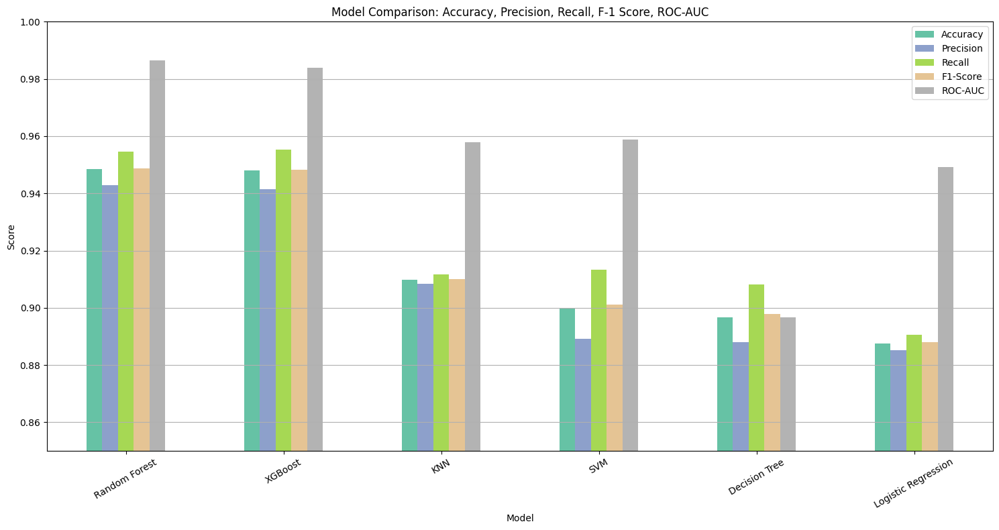

In [30]:
# Plotting the results

results_df.set_index('Model').plot(kind='bar', figsize=(15, 8), colormap='Set2')
plt.title('Model Comparison: Accuracy, Precision, Recall, F-1 Score, ROC-AUC')
plt.ylabel('Score')
plt.ylim(0.85, 1.0)
plt.grid(axis='y')
plt.xticks(rotation=30)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


# Perform Hyperparameter Tuning for Random Forest Classifier

In [31]:
# Step 1: Import and Set Up the Grid

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the base model
rf = RandomForestClassifier(random_state=42)

# Hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}


In [32]:
# Step 2: Apply GridSearchCV

# Grid search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2, scoring='roc_auc')

# Fit on training data
grid_search.fit(X_train_scaled_df, y_train)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='roc_auc', verbose=2)

In [33]:
# Step 3: Extract Best Parameters and Model

best_rf = grid_search.best_estimator_
print("Best Parameters:\n", grid_search.best_params_)


Best Parameters:
 {'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


### Save the Best Random Forest Model with best hyperparameters

In [41]:

import joblib
joblib.dump(best_rf, 'best_random_forest_model.pkl')


['best_random_forest_model.pkl']

In [34]:
# Step 4: Evaluate Tuned Model on Test Set


# Predict on test set
y_pred = best_rf.predict(X_test_scaled_df)
y_prob = best_rf.predict_proba(X_test_scaled_df)[:, 1]

# Evaluation
print("Classification Report:\n", classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_prob))


Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95      1143
           1       0.94      0.96      0.95      1143

    accuracy                           0.95      2286
   macro avg       0.95      0.95      0.95      2286
weighted avg       0.95      0.95      0.95      2286

ROC-AUC Score: 0.9872869128454307


## Trained Machine Learning Model & Hyperparameter Tuning Report

### ✅ Model Used
- **Random Forest Classifier**
- Trained multiple machine learning models and chosen RandomForestClassifier for its robustness, ensemble learning capability, and high performance in binary classification.
- Highest Recall (0.956): Effectively identifies phishing websites with minimal false negatives.

---

### 🔍 Hyperparameter Tuning

- **Technique:** `GridSearchCV`
- **Cross-Validation:** 5-fold
- **Scoring Metric:** ROC-AUC

#### Parameter Grid:
```python
param_grid = {
    'bootstrap': False,
    'max_depth': 20,
    'min_samples_leaf': 1, 
    'min_samples_split': 2, 
    'n_estimators': 300
    'bootstrap': [True, False]
}
```

#### Best Model Configuration (best_estimator_)
```python
RandomForestClassifier(
    bootstrap=False,
    max_depth=30,
    min_samples_split=5,
    min_samples_leaf=1,
    n_estimators=300,
    random_state=42
)
```
- Best parameters were selected based on highest average ROC-AUC across cross-validation folds.

- The final model was used for evaluation, SHAP/LIME explainability, and deployment pipeline.

- It achieved high performance, making it a reliable model for phishing detection.

### **Plot the Evaluation Metrics**

**ROC Curve Plot**

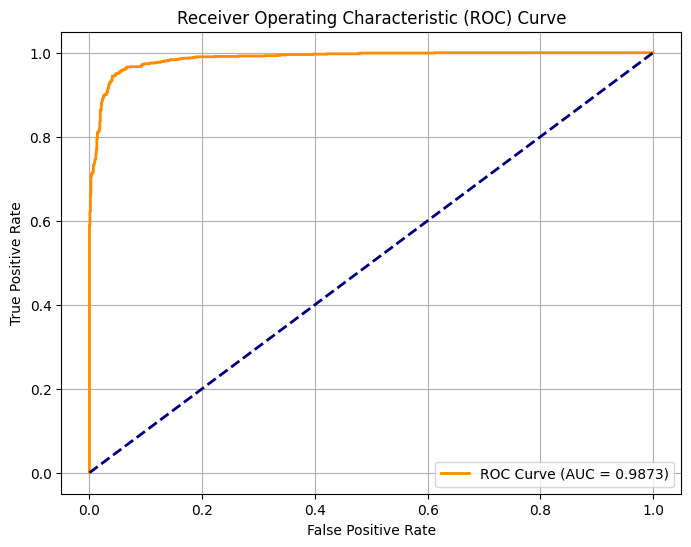

In [35]:
# Predict probabilities for ROC
y_probs = best_rf.predict_proba(X_test_scaled_df)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


**Confusion Matrix Heatmap**



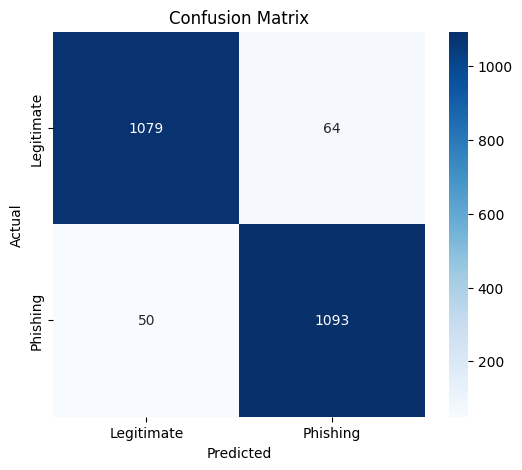

In [36]:
# Predict labels
y_pred = best_rf.predict(X_test_scaled_df)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['Legitimate', 'Phishing']

# Plot heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


**Plot Precision-Recall Curve**

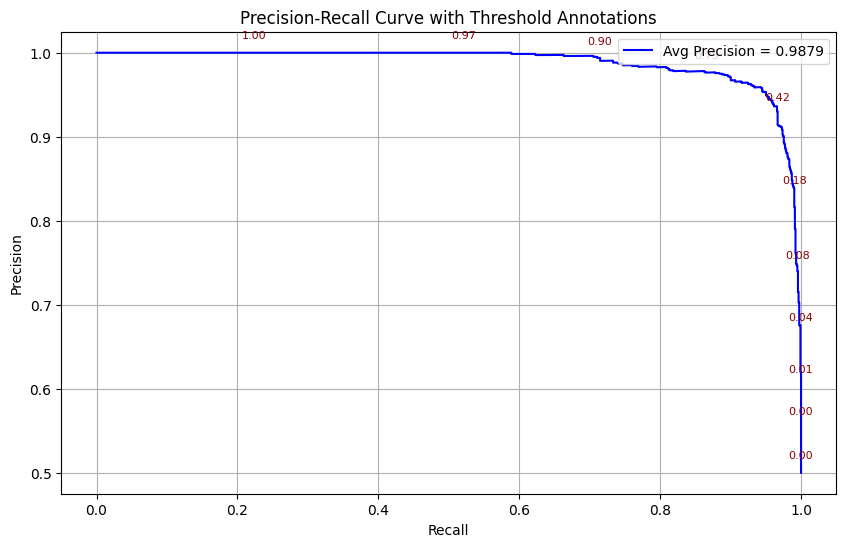

In [37]:
# Get predicted probabilities
y_probs = best_rf.predict_proba(X_test_scaled_df)[:, 1]

# Compute precision-recall pairs
precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
avg_precision = average_precision_score(y_test, y_probs)

# Plot Precision-Recall curve
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, label=f'Avg Precision = {avg_precision:.4f}', color='blue')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve with Threshold Annotations')
plt.grid(True)

# Annotate some thresholds
for i in range(0, len(thresholds), max(1, len(thresholds) // 10)):
    plt.annotate(f"{thresholds[i]:.2f}", 
                 (recall[i], precision[i]), 
                 textcoords="offset points",
                 xytext=(0, 10),
                 ha='center',
                 fontsize=8,
                 color='darkred')

plt.legend(loc='upper right')
plt.show()


# LIME Explainer for Random Forest Classifier

**Step 1: Import and Create the LIME Explainer**

In [38]:
import lime
import lime.lime_tabular

# Create the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_scaled),
    feature_names=X_train.columns.tolist(),
    class_names=['Legitimate', 'Phishing'],
    mode='classification',
    verbose=True,
    feature_selection='auto'
)


**Step 2: Explain Multiple Instances**

In [42]:
# Loop through multiple instances for explanation
for i in range(10): 
    print(f"\n🔍 LIME Explanation for Instance {i} (True Label: {y_test.iloc[i]})")

    exp = explainer.explain_instance(
        data_row=X_test_scaled[i],
        predict_fn=best_rf.predict_proba,
        num_features=len(X_test.columns)  # Explain all features
    )

    # Display in notebook (visual)
    exp.show_in_notebook(show_table=True)

    # Optional: Save to HTML
    exp.save_to_file(f'lime_explanation_instance_{i}.html')



🔍 LIME Explanation for Instance 0 (True Label: 1)
Intercept 0.503550905072144
Prediction_local [0.85911573]
Right: 0.9487689393939394



🔍 LIME Explanation for Instance 1 (True Label: 1)
Intercept 0.7275414770150952
Prediction_local [0.59028459]
Right: 1.0



🔍 LIME Explanation for Instance 2 (True Label: 1)
Intercept 0.7170501558129858
Prediction_local [0.58807355]
Right: 0.9997701149425287



🔍 LIME Explanation for Instance 3 (True Label: 1)
Intercept 0.6543922972174165
Prediction_local [0.77503454]
Right: 0.9507096718813138



🔍 LIME Explanation for Instance 4 (True Label: 0)
Intercept 0.8729099116088367
Prediction_local [0.31851062]
Right: 0.01682567566256812



🔍 LIME Explanation for Instance 5 (True Label: 0)
Intercept 0.975932753105341
Prediction_local [0.11853016]
Right: 0.04709245540321392



🔍 LIME Explanation for Instance 6 (True Label: 0)
Intercept 0.8201018416826715
Prediction_local [0.41277829]
Right: 0.005240987083092346



🔍 LIME Explanation for Instance 7 (True Label: 1)
Intercept 0.6648568451717694
Prediction_local [0.60522493]
Right: 0.9857829836829837



🔍 LIME Explanation for Instance 8 (True Label: 0)
Intercept 0.9044102650536469
Prediction_local [0.11076633]
Right: 0.0



🔍 LIME Explanation for Instance 9 (True Label: 1)
Intercept 0.4792119133270608
Prediction_local [1.00375323]
Right: 0.98


### LIME Explanation Report (Instance-Level Model Interpretability)
- LIME was applied on multiple test instances to interpret the Random Forest classifier predictions for phishing detection.

- Key features influencing predictions included:

 `url_complexity`, `phish_hints`, `nb_www`, `nb_qm`, and `domain_numeric_intensity`

- Engineered features demonstrated strong explanatory power across all instances, validating their inclusion.

- LIME revealed that the same feature (e.g., prefix_suffix, ratio_digits_url) may have positive or negative impact depending on the context.

- Visualizations confirmed that most predictions were driven by a small subset of high-impact features, enhancing transparency and trust in the model.



**Step 3: Plot Feature Weights as Bar Plot**

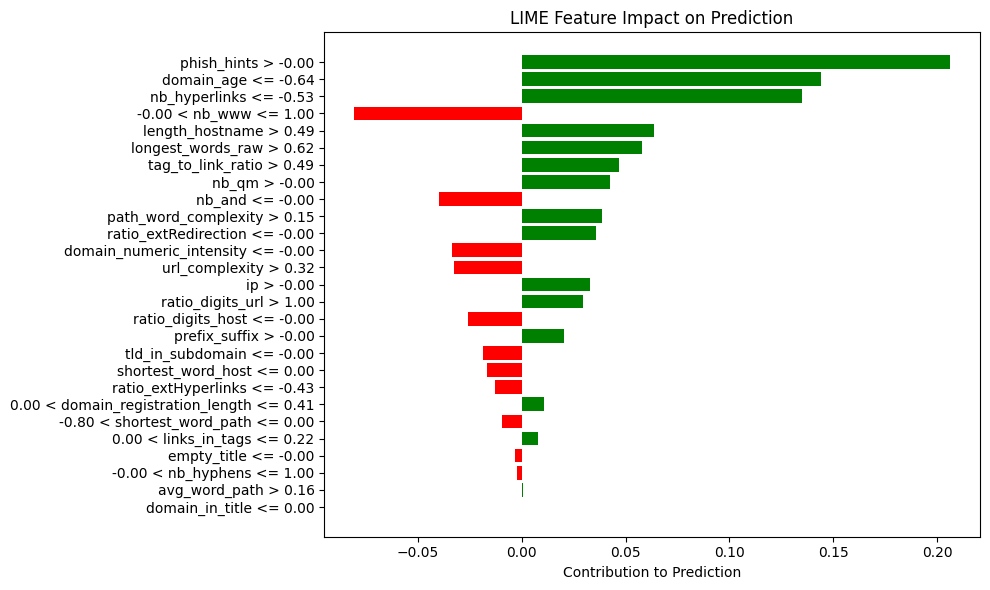

In [40]:

# Plot feature impact bar chart (manual)
def plot_lime_weights(exp):
    weights = dict(exp.as_list())
    features = list(weights.keys())
    values = list(weights.values())

    plt.figure(figsize=(10, 6))
    plt.barh(features, values, color=['green' if v > 0 else 'red' for v in values])
    plt.title("LIME Feature Impact on Prediction")
    plt.xlabel("Contribution to Prediction")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

# Example: Plot for instance 0
plot_lime_weights(exp)


## LIME Feature Impact - Phishing Detection

### 🟢 Features Positively Contributing to "Not Phishing"
These features indicate the URL is **likely safe**:
- **`phish_hints > 0.00`** → Absence of phishing-related hints supports legitimacy.
- **`domain_age > -0.64`** → Older domains are usually trustworthy.
- **`nb_hyperlinks <= -0.53`** → Fewer hyperlinks suggest a safe page.
- **`-0.00 < nb_www <= 1.00`** → Moderate use of "www" correlates with legitimate URLs.
- **`length_hostname > 0.49`** → Longer hostnames are often used by real sites.
- **`longest_words_raw > 0.62`** → Longer words in content support legitimacy.
- **`tag_to_link_ratio > 0.49`** → Proper HTML structure suggests trustworthiness.
- **`url_complexity > 0.32`** → Sophisticated URLs (not overly simple) tend to be legitimate.
- **`ip > -0.00`** → Presence of a valid IP can be a positive sign.
- **`ratio_digits_url > 1.00`** → Balanced use of digits is common in real sites.
- **`path_word_complexity > 0.15`** → Complex paths often indicate dynamic, real content.

### 🔴 Features Negatively Impacting Prediction (Pointing to "Phishing")
These features raise suspicion:
- **`nb_www` in range `-0.00 < nb_www <= 1.00`** (in excess) → May indicate phishing.
- **`domain_numeric_intensity <= -0.00`** → Excessive numbers in the domain = red flag.
- **`nb_qm > -0.00`** → Use of query parameters may imply phishing.
- **`prefix_suffix > 0.00`** → Hyphenated domains often impersonate real brands.
- **`tld_in_subdomain <= -0.00`** → Misuse of top-level domains in subdomains is suspicious.
- **`domain_registration_length < 0.41`** → Recently registered domains are often phishing sites.
- **`shortest_word_host <= 0.00`** → Very short words in host part may be autogenerated.

---